In [1]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [2]:
import pandas as pd
from sklearn.metrics import mean_squared_error

In [3]:
def set_xaxis(ax, n_x, xlabel='time', ylabel='veh/5m'):
    x_ticks_major= []
    x_ticks_minor= []
    x_labels_minor= []
    x_labels_major= []
    m_empty_string= ''
    for i in xrange(n_x):
        m_time_minute= 5 * (i + 1)
        m_minute_string= '{}M'.format(m_time_minute).zfill(5)
        if m_time_minute % 60 == 0:
            m_hour= m_time_minute / 60
            m_hour_string= '{}H'.format(m_hour).zfill(3)
            x_ticks_major.append(float(i))
            x_labels_major.append(m_hour_string)
        else:
            x_ticks_minor.append(float(i))
            x_labels_minor.append(m_minute_string)
    ax.set_xticks(x_ticks_minor, minor=True)
    ax.set_xticks(x_ticks_major, minor=False)
    ax.set_xticklabels(x_labels_major, minor=False, rotation=65)
    ax.grid(True, which='major')
    if xlabel is not None:
        ax.set_xlabel(xlabel)
    if ylabel is not None:
        ax.set_ylabel(ylabel)

In [4]:
def get_reconstruction(eigenvectors, Mean, x):
    # Compute the projection of the data on the top eigen-vectors
    Eig= np.matrix(eigenvectors)
    #
    matrix = np.matrix(x) - Mean
    matrix[np.isnan(matrix)] = 0
    m_projection = matrix * Eig;
    #
    rec = np.array(m_projection * Eig.transpose() + Mean)
    #rec= Eig*m_projection.transpose()+Mean[:,np.newaxis]
    rec = np.ravel(rec)
    return (x, rec)

In [5]:
def display_reconstruction(eigs, mean, arr, label_format):
    rec= get_reconstruction(eigs, mean, arr)
    m_orig_x= rec[0]
    m_rec= rec[1]

    fig, ax= plt.subplots(figsize=figsize)
    ax.plot(m_orig_x, c='g', label='orig')
    ax.plot(m_rec, c='b', label='recon')
    #
    set_xaxis(ax, len(m_rec))
    rmse= np.sqrt(mean_squared_error(m_orig_x, m_rec))
    rmse= rmse / (max(m_orig_x) - min(m_orig_x))
    label= label_format + '_NRMSE_{}'.format(rmse)
    ax.set_title(label)
    ax.legend()
    return (rmse, label)

In [6]:
def get_reconstruction_from_projection(eigenvectors, Mean, m_projection):
    Eig= np.matrix(eigenvectors)
    rec = np.array(m_projection * Eig.transpose() + Mean)
    #rec= Eig*m_projection.transpose()+Mean[:,np.newaxis]
    return np.ravel(rec)

In [7]:
def display_reconstruction_from_projection(eigs, mean, m_projection, label):
    rec= get_reconstruction_from_projection(eigs, mean, m_projection)

    fig, ax= plt.subplots(figsize=figsize)
    ax.plot(rec, c='b', label='recon')
    #
    set_xaxis(ax, len(rec))
    ax.set_title(label)
    ax.legend()

In [8]:
figsize= (16,8)

# Reconstruction on Top Eigenvectors with Normalized Root Mean Square Error

In [9]:
partitions= ['weekday', 'weekend']
years= [2008, 2009, 2010, 2011, 2013, 2014, 2015]

base_mean_path= './data/{}/total_flow_{}_mean_vector.pivot_{}_grouping_pca_tmp.csv'
base_eigs_path= './data/{}/total_flow_{}_eigenvectors.pivot_{}_grouping_pca_tmp.csv'
base_samples_path= './data/{}/total_flow_{}_samples.pivot_{}_grouping_pca_tmp.csv'

/home/dyerke/anaconda/lib/python2.7/site-packages/matplotlib/pyplot.py:424: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


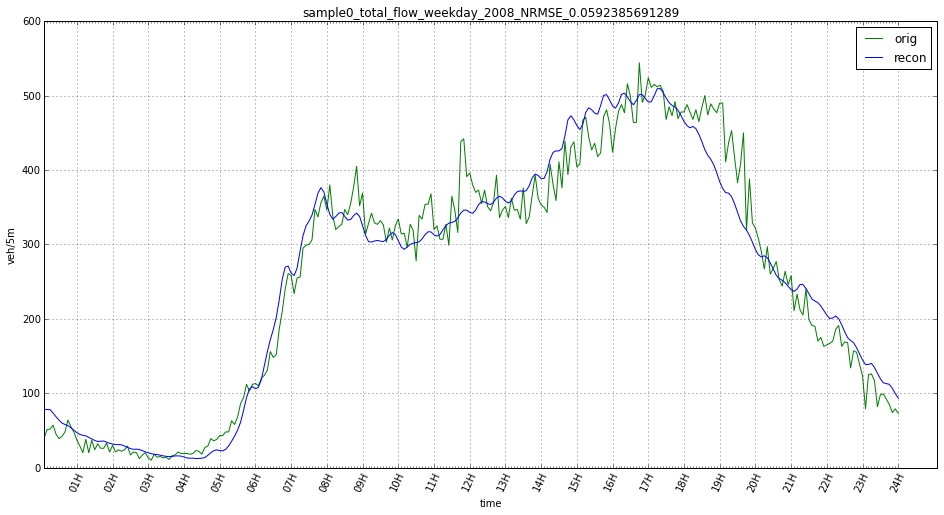

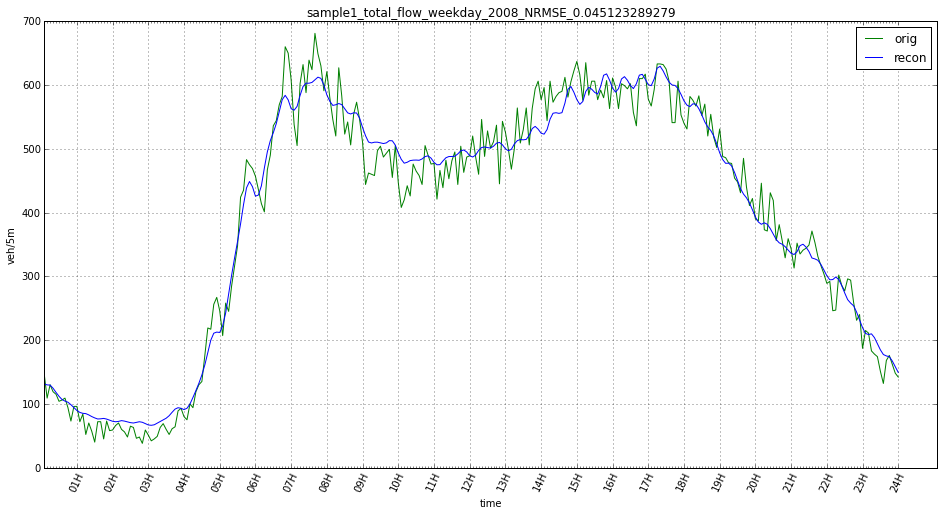

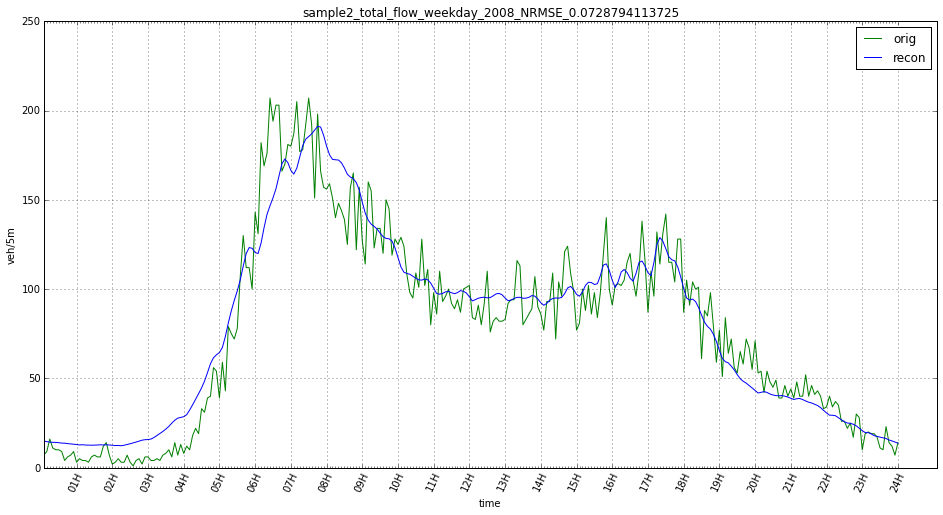

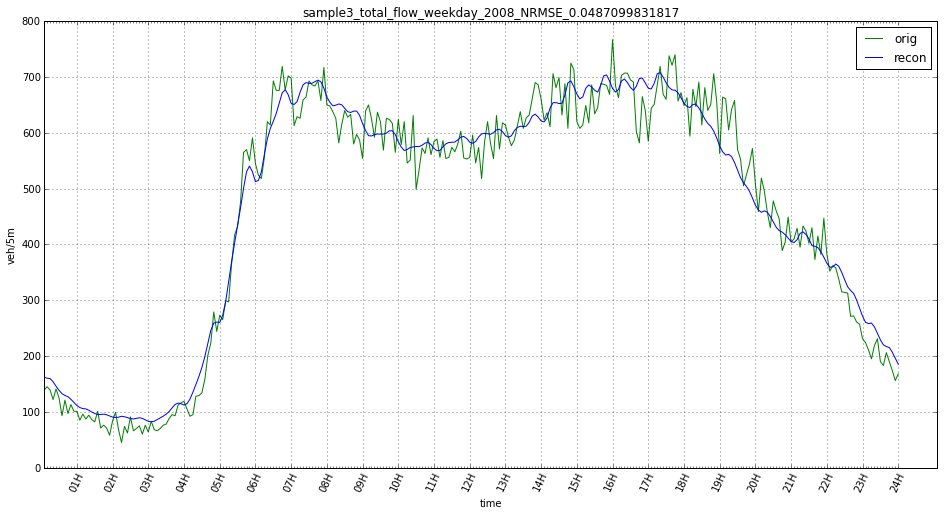

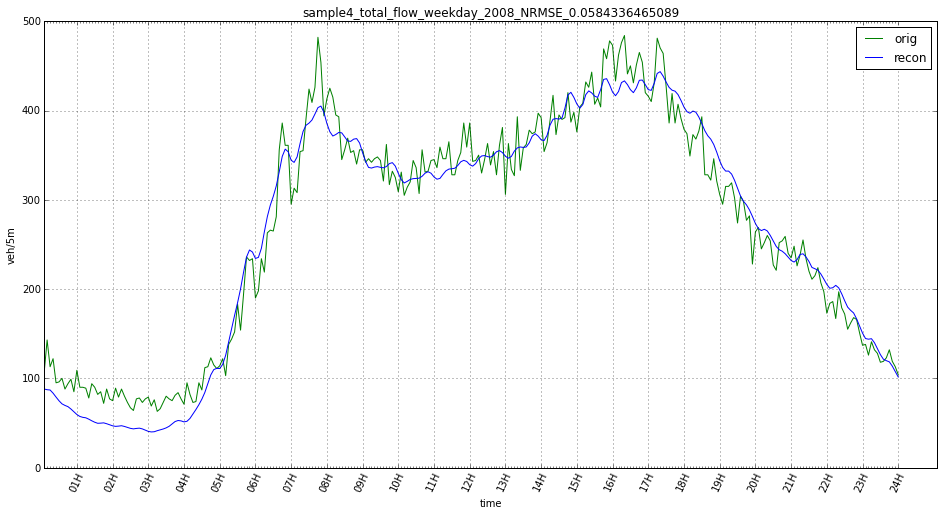

...

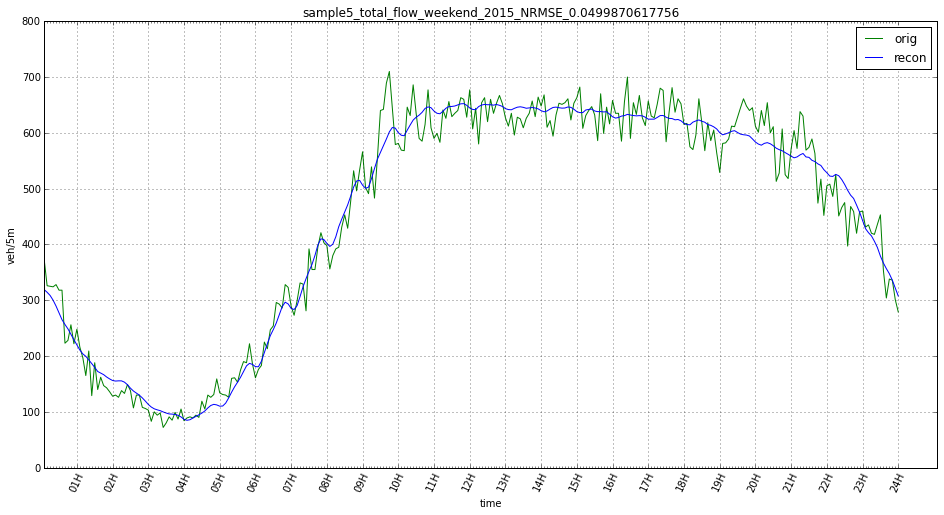

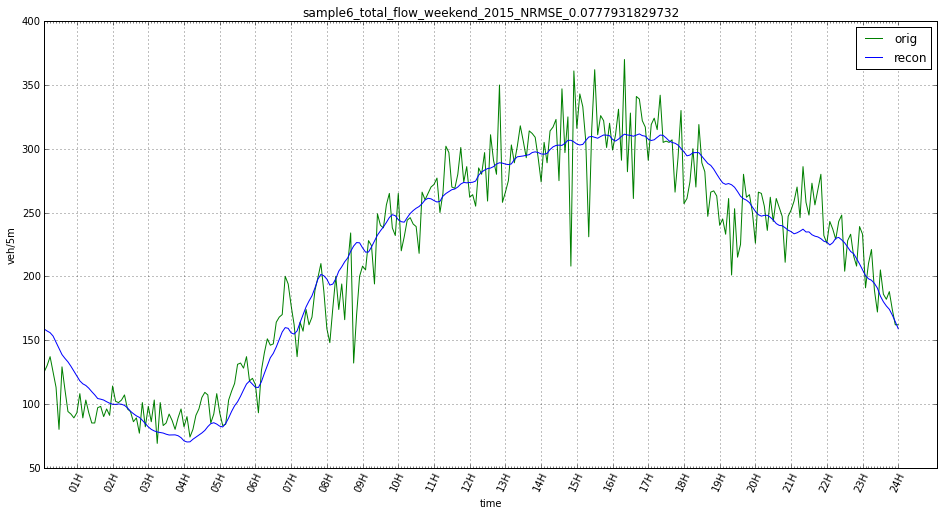

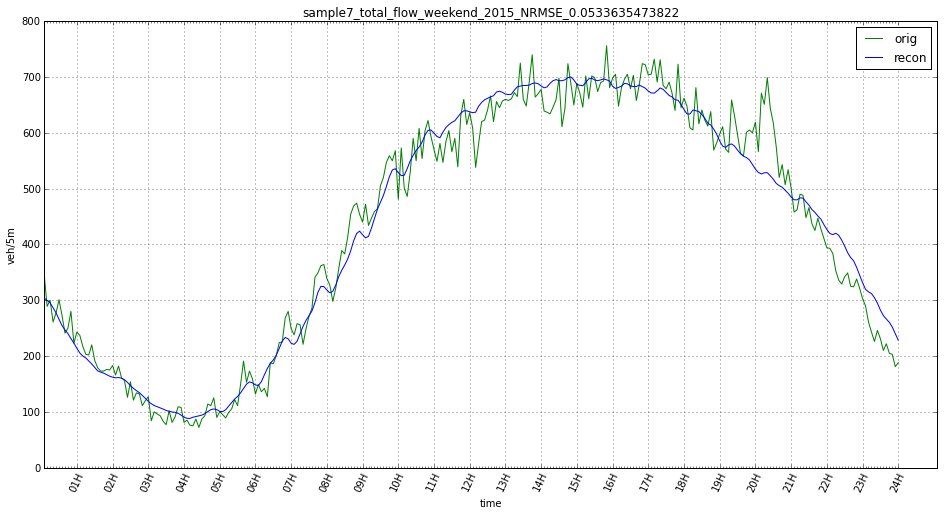

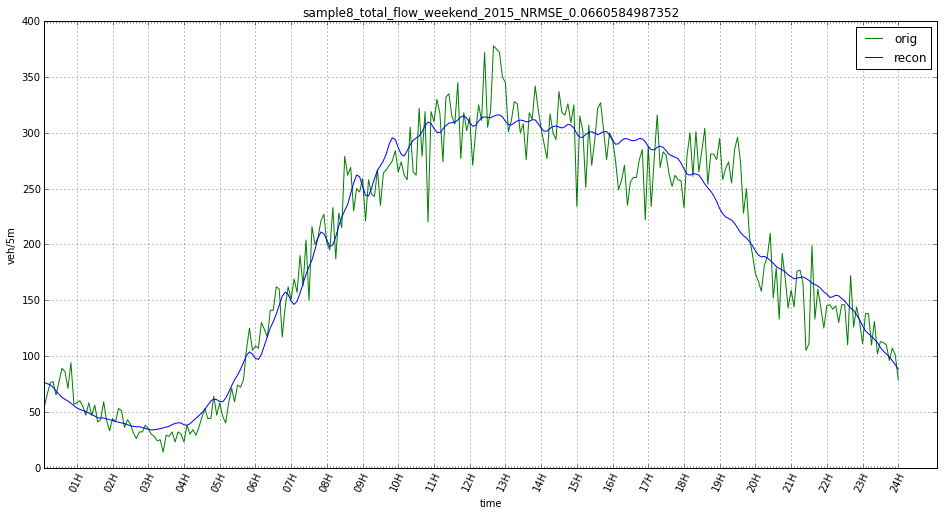

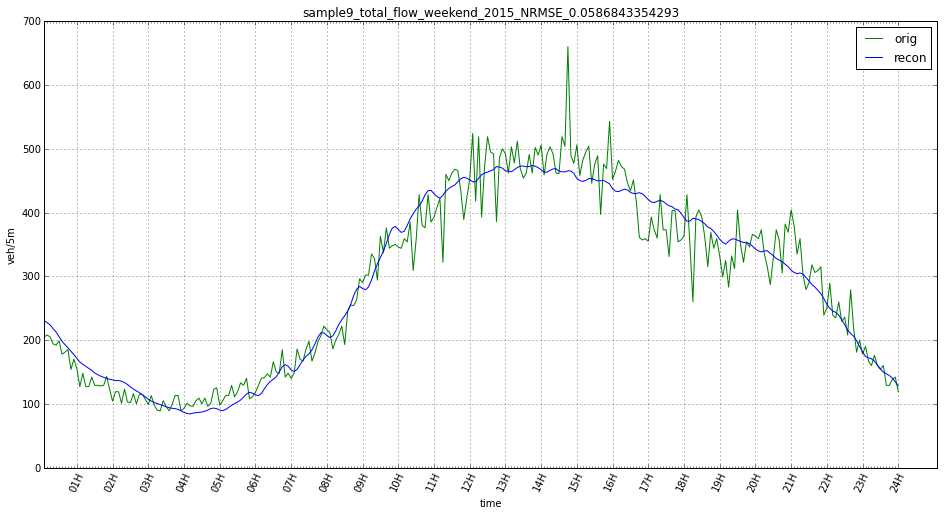

In [10]:
results= []
for p in partitions:
    for y in years:
        mean = pd.read_csv(base_mean_path.format(p, p, y), header=None).values[0]
        eigs = pd.read_csv(base_eigs_path.format(p, p, y), header=None).values  # eigenvectors per row matrix (5 X 288)
        samples_df= pd.read_csv(base_samples_path.format(p, p, y), header=None)
        #
        for i, a_row in samples_df.iterrows():
            arr= a_row.values
            label_format= 'sample{}_total_flow_{}_{}'.format(i, p, y)
            results.append(display_reconstruction(eigs, mean, arr, label_format))

In [11]:
sorted_results= sorted(results, key=lambda x: x[0])
sorted_results[0:20]

[(0.019781428569520327,
  'sample1_total_flow_weekend_2011_NRMSE_0.0197814285695'),
 (0.023640225054551087,
  'sample3_total_flow_weekend_2014_NRMSE_0.0236402250546'),
 (0.025500947592576165,
  'sample2_total_flow_weekend_2008_NRMSE_0.0255009475926'),
 (0.026063013049211943,
  'sample9_total_flow_weekend_2014_NRMSE_0.0260630130492'),
 (0.03206811862202049, 'sample2_total_flow_weekend_2014_NRMSE_0.032068118622'),
 (0.034327121076797702,
  'sample3_total_flow_weekday_2011_NRMSE_0.0343271210768'),
 (0.036696293135541909,
  'sample7_total_flow_weekday_2014_NRMSE_0.0366962931355'),
 (0.040891700526427079,
  'sample9_total_flow_weekday_2011_NRMSE_0.0408917005264'),
 (0.043365936922571513,
  'sample6_total_flow_weekend_2008_NRMSE_0.0433659369226'),
 (0.043776098705457477,
  'sample5_total_flow_weekend_2013_NRMSE_0.0437760987055'),
 (0.04438662389780651,
  'sample4_total_flow_weekend_2008_NRMSE_0.0443866238978'),
 (0.044669782022474992,
  'sample6_total_flow_weekday_2014_NRMSE_0.0446697820225'